Linki
- https://medium.com/@kate.ruksha/introduction-into-music-information-retrieval-part-1-2dc874cda763
- https://blog.monikaprajapati.com.np/processing-sound-files-for-emotion-recognition
- https://medium.com/analytics-vidhya/understanding-the-mel-spectrogram-fca2afa2ce53

In [113]:
import os
import numpy as np
import noisereduce as nr
import matplotlib.pyplot as plt
from sklearn.preprocessing import minmax_scale
import librosa
from IPython.display import Audio

In [23]:
audio = "C:\\Users\\Gabi\\.cache\\kagglehub\\datasets\\imsparsh\\deam-mediaeval-dataset-emotional-analysis-in-music\\versions\\1\\DEAM_audio\\MEMD_audio"
audio_path = dict()
for dirname, _, filenames in os.walk(audio):
    for filename in filenames:
        songId = int(filename.replace('.mp3', ''))
        audio_path[songId] = os.path.join(dirname, filename)

- y - szereg czasowy jako tablica dwuwymiarowa:
    - nagrana amplituda danej próbki
    - liczba kanałów audio
- sr - sample rate - ilość nagranych próbek na sekundę
<br>
librosa automatycznie resampluje do 22 050 próbek na sekundę, chyba że dodamy parametr 'sr'

In [57]:
y_happy, sr_happy = librosa.load(audio_path[20])
sr_happy

22050

- długość utworu

In [51]:
y_happy.shape[0] / sr_happy

45.03487528344671

In [58]:
y_angry, sr_angry = librosa.load(audio_path[17])
y_sad, sr_sad = librosa.load(audio_path[2])
y_calm, sr_calm = librosa.load(audio_path[46])

brzmienie utworu

In [53]:
Audio(data=y_happy, rate=sr_happy)

- tempo - ilość uderzeń na minutę (beats per minute)
- beat_frames - sekundy, w których nastąpiło uderzenie

In [54]:
tempo, beat_frames = librosa.beat.beat_track(y=y_happy, sr=sr_happy)

In [55]:
# Convert beat frames to time
beat_times = librosa.frames_to_time(beat_frames, sr=sr_happy)
print(f"Tempo: {tempo} BPM")
print(f"Beat Times: {beat_times}")

Tempo: [112.34714674] BPM
Beat Times: [ 0.09287982  0.67337868  1.20743764  1.7414966   2.29877551  2.83283447
  3.36689342  3.90095238  4.45823129  4.99229025  5.54956916  6.08362812
  6.61768707  7.15174603  7.68580499  8.2430839   8.77714286  9.31120181
  9.86848073 10.40253968 10.93659864 11.4706576  12.02793651 12.56199546
 13.09605442 13.63011338 14.18739229 14.72145125 15.27873016 15.81278912
 16.34684807 16.88090703 17.43818594 17.9722449  18.50630385 19.04036281
 19.59764172 20.13170068 20.66575964 21.19981859 21.75709751 22.29115646
 22.84843537 23.35927438 23.91655329 24.45061224 24.9846712  25.51873016
 26.07600907 26.61006803 27.14412698 27.7014059  28.23546485 28.76952381
 29.32680272 29.86086168 30.39492063 30.92897959 31.4862585  32.02031746
 32.55437642 33.08843537 33.64571429 34.17977324 34.7138322  35.24789116
 35.80517007 36.33922902 36.87328798 37.40734694 37.96462585 38.49868481
 39.03274376 39.59002268 40.14730159 40.65814059 41.2154195  41.74947846
 42.28353741 

- waveform - kształ fali dźwięku - jak amplituda zmienia się w czasie

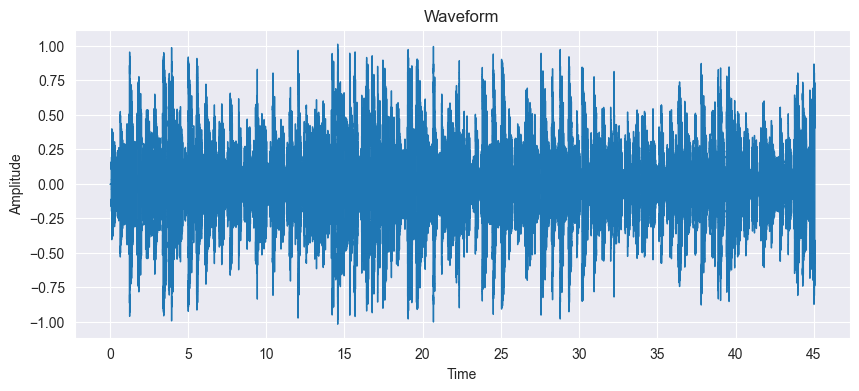

In [63]:
plt.figure(figsize=(10, 4))
librosa.display.waveshow(y=y_happy, sr=sr_happy)
plt.title("Waveform")
plt.ylabel("Amplitude")
plt.show()

Text(0.5, 1.0, 'Calm')

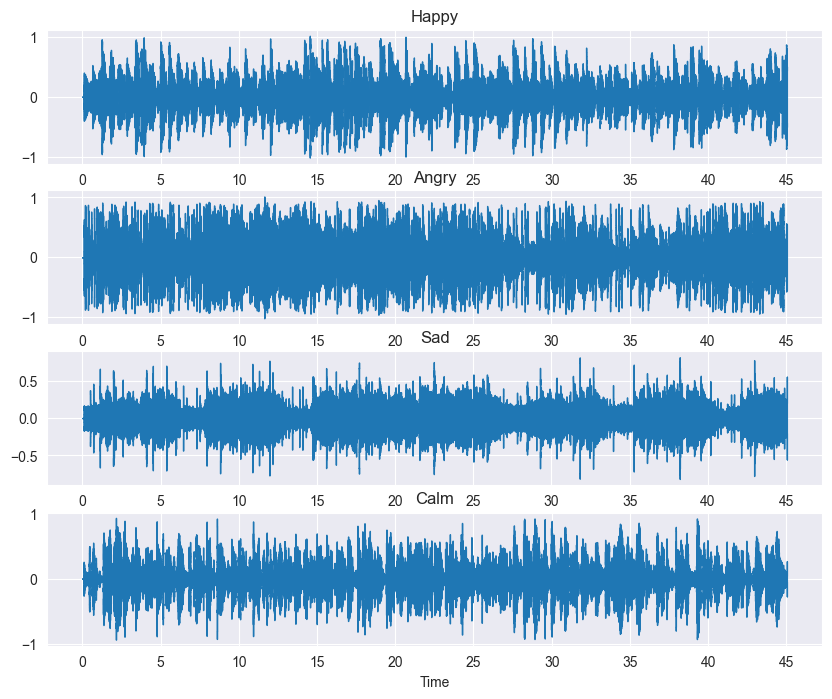

In [106]:
figure, axis = plt.subplots(4, 1, figsize=(10, 8))

librosa.display.waveshow(y=y_happy, sr=sr_happy, ax=axis[0])
axis[0].set_title("Happy")

librosa.display.waveshow(y=y_angry, sr=sr_angry, ax=axis[1])
axis[1].set_title("Angry")

librosa.display.waveshow(y=y_sad, sr=sr_sad, ax=axis[2])
axis[2].set_title("Sad")

librosa.display.waveshow(y=y_calm, sr=sr_calm, ax=axis[3])
axis[3].set_title("Calm")

- spectrum - graf: oś x to częstotliwość, a oś y to amplituda
<br>
za pomocą transformaty Fouriera (stft)

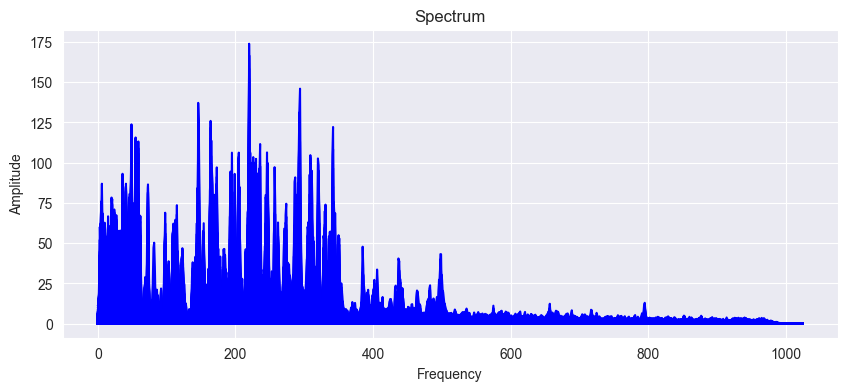

In [66]:
stft_data = np.abs(librosa.stft(y=y_happy, n_fft=2048, hop_length=512))

plt.figure(figsize=(10, 4))
plt.plot(stft_data, color='b')
plt.title("Spectrum")
plt.xlabel("Frequency")
plt.ylabel("Amplitude")
plt.show()

Text(0.5, 1.0, 'Calm')

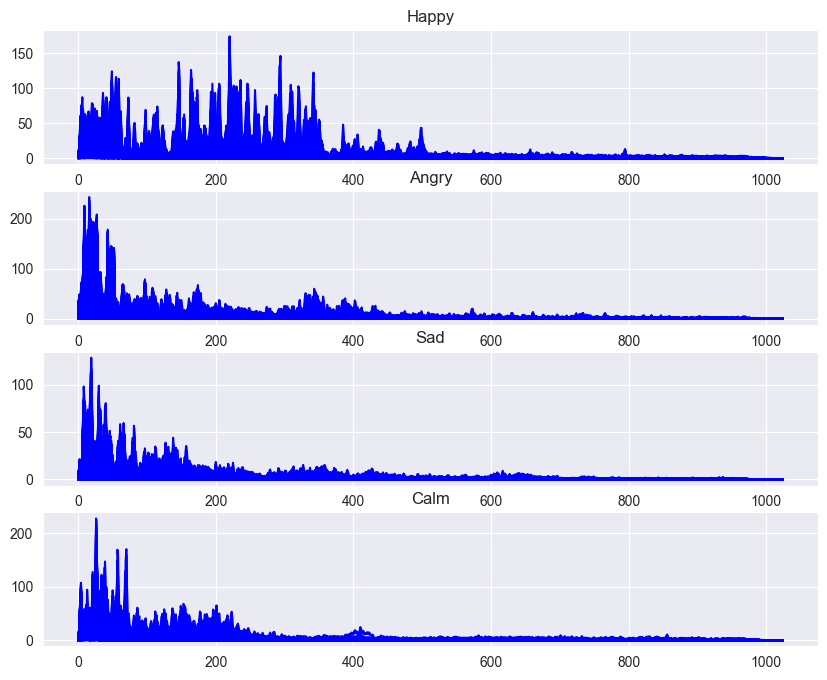

In [111]:
figure, axis = plt.subplots(4, 1, figsize=(10, 8))

axis[0].plot(np.abs(librosa.stft(y=y_happy, n_fft=2048, hop_length=512)), color='b')
axis[0].set_title("Happy")

axis[1].plot(np.abs(librosa.stft(y=y_angry, n_fft=2048, hop_length=512)), color='b')
axis[1].set_title("Angry")

axis[2].plot(np.abs(librosa.stft(y=y_sad, n_fft=2048, hop_length=512)), color='b')
axis[2].set_title("Sad")

axis[3].plot(np.abs(librosa.stft(y=y_calm, n_fft=2048, hop_length=512)), color='b')
axis[3].set_title("Calm")

- spectrogram:
    - oś x - czas
    - oś y - częstotliwość
    - kolor - amplituda

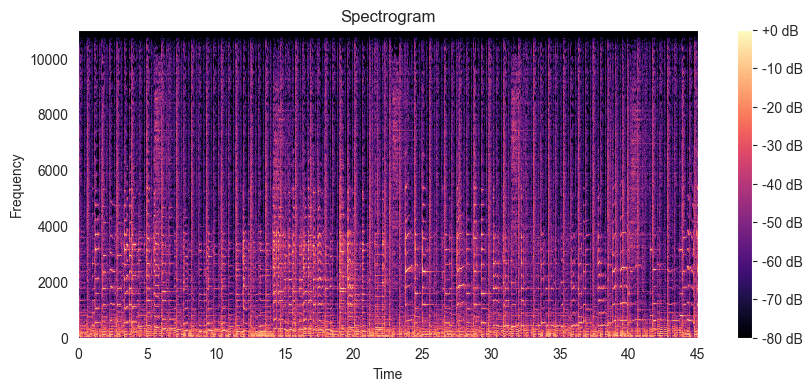

In [72]:
spec = librosa.amplitude_to_db(stft_data, ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(spec, x_axis='time', y_axis='linear')
plt.colorbar(format='%+2.0f dB')
plt.title("Spectrogram")
plt.ylabel("Frequency")
plt.show()

- melspectrogram - spectrogram oparty na skali mel, która przedstawia subiektywny odbiór częstotliwości przez ludzi

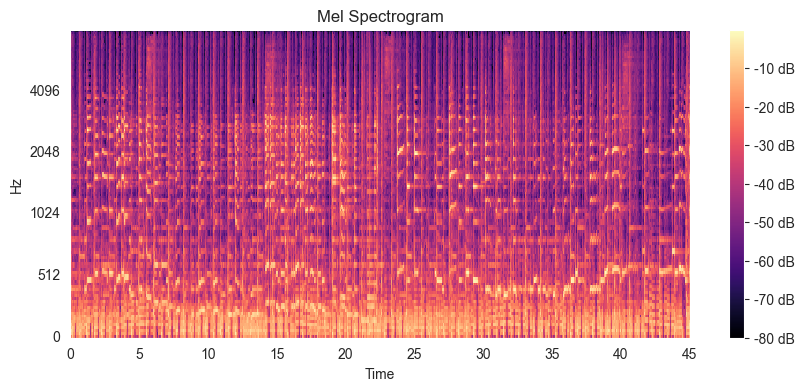

In [75]:
mel_spec = librosa.feature.melspectrogram(y=y_happy, sr=sr_happy, hop_length=512)
mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

plt.figure(figsize=(10, 4))
librosa.display.specshow(mel_spec_db, y_axis='mel', fmax=8000, x_axis='time')
plt.title('Mel Spectrogram')
plt.colorbar(format='%+2.0f dB');

- chromagram - przedstawia, jakie wysokości dźwięków o jakiej częstotliwości występowały w danym czasie

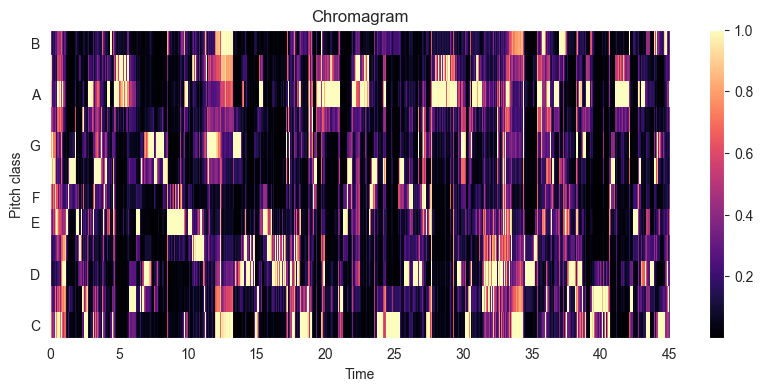

In [7]:
chroma = librosa.feature.chroma_stft(y=y_happy, sr=sr_happy)

plt.figure(figsize=(10, 4))
librosa.display.specshow(chroma, sr=sr_happy, x_axis='time', y_axis='chroma')
plt.colorbar()
plt.title("Chromagram")
plt.show()

- mel frequency cepstral coefficients - współczyniki prezentujące cechy widmowe (po transformacji do skali mel powrót do domeny czasu)

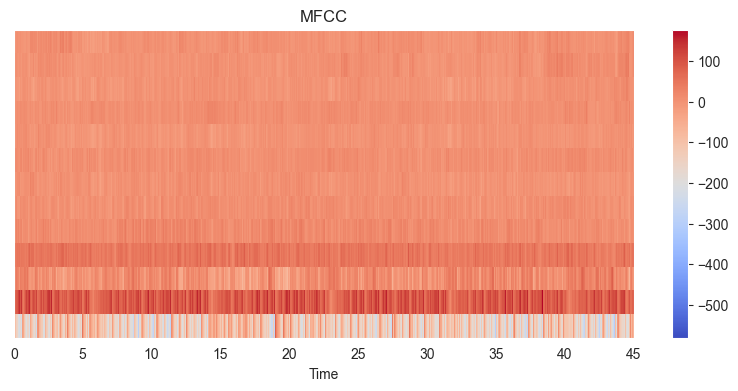

In [79]:
mfccs = librosa.feature.mfcc(y=y_happy, sr=sr_happy, n_mfcc=13)

plt.figure(figsize=(10, 4))
librosa.display.specshow(mfccs, sr=sr_happy, x_axis='time')
plt.colorbar()
plt.title("MFCC")
plt.show()

- spectral centroid - wskazuje na jakiej częstotliwości znajduje się środek masy spektrum - określa "jasność" dźwięku

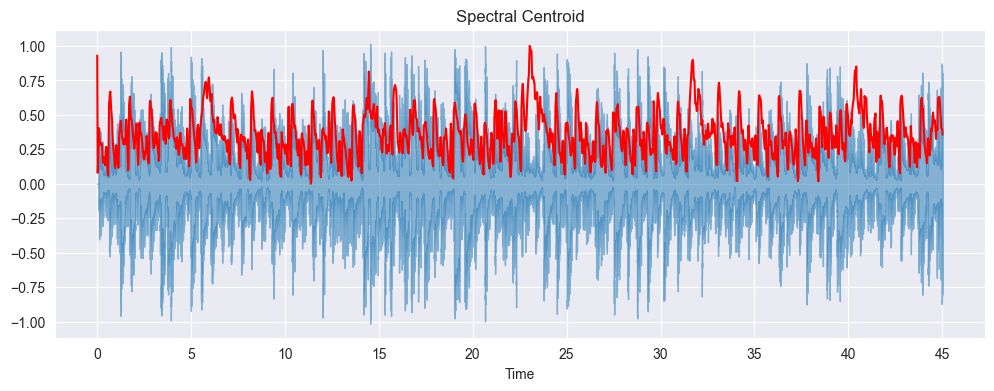

In [90]:
spectral_centroid = librosa.feature.spectral_centroid(y=y_happy, sr=sr_happy)[0]

frames = range(len(spectral_centroid))
t = librosa.frames_to_time(frames)

plt.figure(figsize=(12, 4))
librosa.display.waveshow(y_happy, sr=sr_happy, alpha=0.5)
plt.plot(t, minmax_scale(spectral_centroid, axis=0), color='r')
plt.title("Spectral Centroid")
plt.show()

- spectral roll-off - częstotliwość poniżej której znajduje się x procent całkowitej częstotliwości spektrum

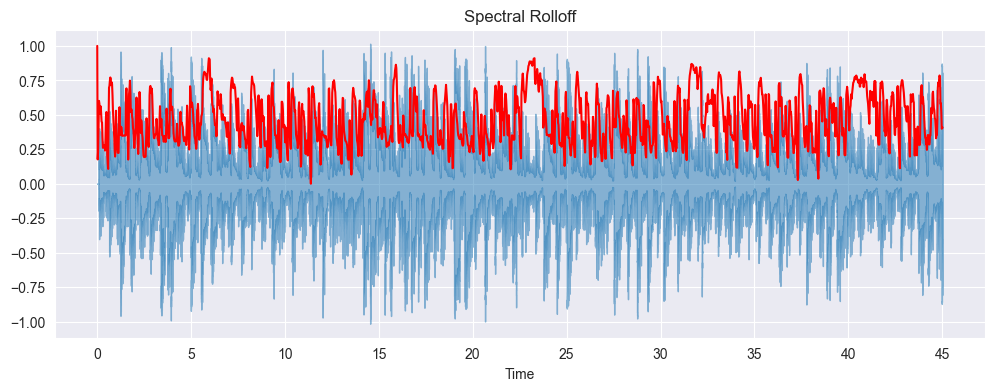

In [92]:
spectral_rolloff = librosa.feature.spectral_rolloff(y=y_happy, sr=sr_happy, roll_percent=0.85)[0]

plt.figure(figsize=(12, 4))
librosa.display.waveshow(y_happy, sr=sr_happy, alpha=0.5)
plt.plot(t, minmax_scale(spectral_rolloff), color='r', label='Spectral Rolloff')
plt.title("Spectral Rolloff")
plt.show()

- zero crossing rate - jak szybko amplituda sygnału zmienia znak

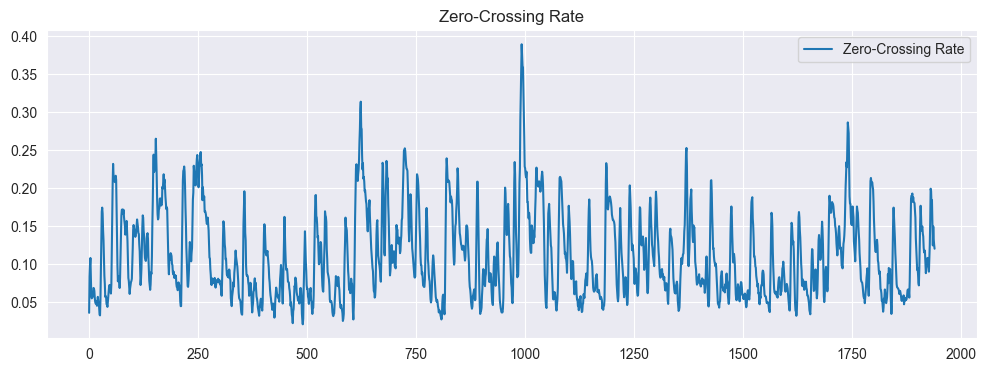

In [93]:
zero_crossings = librosa.feature.zero_crossing_rate(y_happy)
plt.figure(figsize=(12, 4))
plt.plot(zero_crossings[0], label="Zero-Crossing Rate")
plt.legend(loc='upper right')
plt.title("Zero-Crossing Rate")
plt.show()

- podział na samą melodię i sam rytm

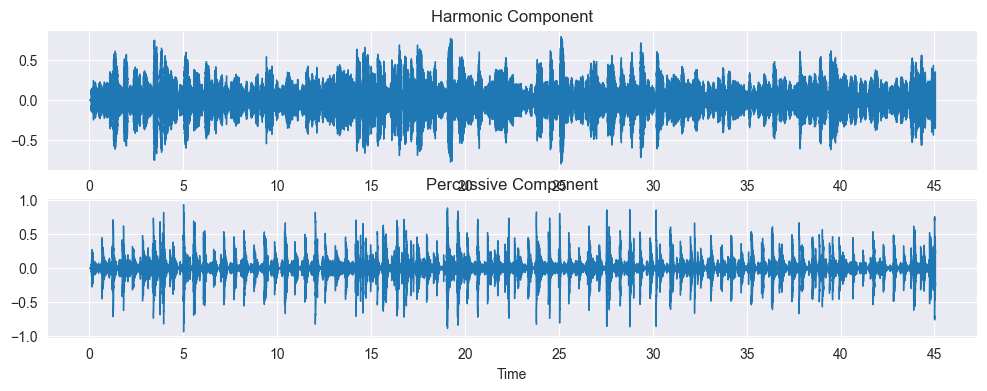

In [94]:
y_harmonic, y_percussive = librosa.effects.hpss(y_happy)

plt.figure(figsize=(12, 4))
plt.subplot(2, 1, 1)
librosa.display.waveshow(y_harmonic, sr=sr_happy)
plt.title("Harmonic Component")
plt.subplot(2, 1, 2)
librosa.display.waveshow(y_percussive, sr=sr_happy)
plt.title("Percussive Component")
plt.show()

In [95]:
Audio(data=y_harmonic, rate=sr_happy)

In [96]:
Audio(data=y_percussive, rate=sr_happy)

- onset - początek dźwięku

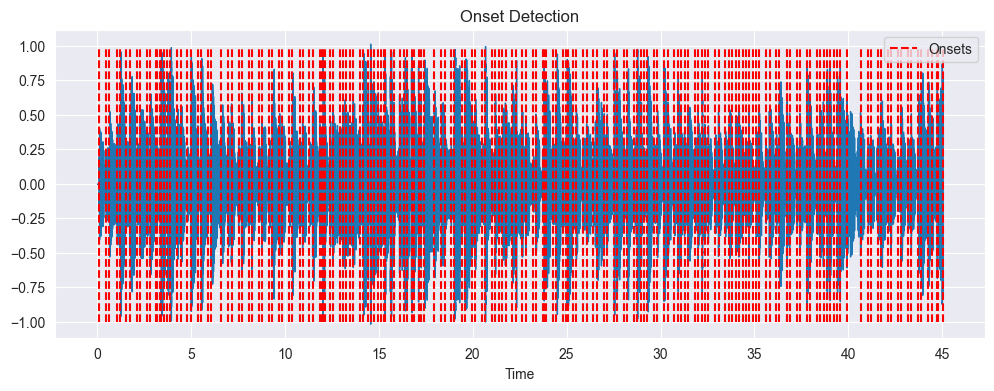

In [97]:
onset_frames = librosa.onset.onset_detect(y=y_happy, sr=sr_happy)
onset_times = librosa.frames_to_time(onset_frames, sr=sr_happy)

plt.figure(figsize=(12, 4))
librosa.display.waveshow(y_happy, sr=sr_happy)
plt.vlines(onset_times, ymin=-1, ymax=1, color='r', linestyle='--', label='Onsets')
plt.legend()
plt.title("Onset Detection")
plt.show()

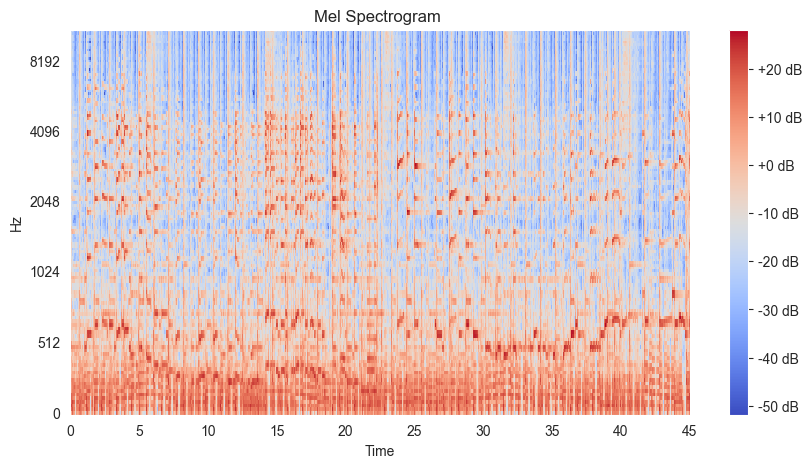

In [98]:
spectrogram = librosa.feature.melspectrogram(y=y_happy, sr=sr_happy, n_mels=128, fmax=8000)
log_spectrogram = librosa.power_to_db(spectrogram)

plt.figure(figsize=(10, 5))
librosa.display.specshow(log_spectrogram, y_axis='mel', sr=sr_happy, x_axis='time')
plt.title('Mel Spectrogram ')
plt.colorbar(format='%+2.0f dB')

In [115]:
Audio(data=y_happy, rate=sr_happy)

In [114]:
reduced_noise = nr.reduce_noise(y=y_happy, sr=sr_happy)
Audio(data=reduced_noise, rate=sr_happy)

In [116]:
Audio(data=y_sad, rate=sr_sad)

In [117]:
reduced_noise = nr.reduce_noise(y=y_sad, sr=sr_sad)
Audio(data=reduced_noise, rate=sr_sad)